In [1]:
# pip install ruptures

In [2]:
import pandas as pd
import numpy as np
from pandas import json_normalize
import json

In [3]:
dfBatch1 = pd.read_csv('MTDataBatch1\MTDataBatch1.rpt', delimiter='|')

In [4]:
def input_process(df):
    
    # delete inconsistent rows with title values
    df = df.loc[df['Id'].astype(str).str.isnumeric()]
        
    # load 'Data' from json
    json_data = df['Data'].apply(json.loads)
    df_data = pd.json_normalize(json_data)

    
    # drop origial 'Data' and join with json data
    df = df.drop('Data', axis = 1)
    df = pd.concat([df.reset_index(drop=True), df_data], axis=1)
    df['DeviceId'] = df['DeviceId'].astype(str)
    return df

In [5]:
df = input_process(dfBatch1)

In [6]:
df.loc[1684079]

Id                                                   195391320
CreatedAt                   2021-11-22 02:04:57.8307232 +00:00
UpdatedAt                   2021-11-22 02:04:57.9257593 +00:00
DeviceId                                       015262001276442
State                                                        1
timeStamp                                 2021-11-22T02:04:17Z
event                                    [{'type': 'stopped'}]
sensors.battery.extpower                                 False
sensors.battery.temp                                      27.2
sensors.battery.percent                                   22.3
sensors.battery.solarmv                                   2091
sensors.battery.current                                    -43
sensors.battery.voltage                                   3456
sensors.battery.solarma                                     67
sensors.battery.charging                                 False
location.bearing                                       

In [7]:
display(df)

,Id,CreatedAt,UpdatedAt,DeviceId,State,timeStamp,event,sensors.battery.extpower,sensors.battery.temp,sensors.battery.percent,...,location.altitude,location.longitude,location.numSats,location.source,location.latitude,location.speed,location.accuracy,sensors.accelerometer.y,sensors.accelerometer.x,sensors.accelerometer.z
0,10046,2021-04-20 17:18:57.3601057 +00:00,2021-04-20 17:18:57.4751133 +00:00,015262001277846,1,2021-04-20T17:18:26Z,[{'type': 'moving'}],False,15.8,72.4,...,65.583,151.218047,11.0,gps,-33.960585,198,4.049,NaN,NaN,NaN
1,10049,2021-04-20 17:18:57.9206698 +00:00,2021-04-20 17:18:58.0006530 +00:00,015262001277846,1,2021-04-20T17:17:52Z,[{'type': 'moving'}],False,15.9,72.3,...,30.239,151.218558,15.0,gps,-33.959840,0,2.830,81.0,-956.0,16.0
2,15189,2021-04-20 17:30:00.0973275 +00:00,2021-04-20 17:30:00.1973672 +00:00,015262001277846,1,2021-04-20T17:27:29Z,[{'type': 'moving'}],False,16.6,72.4,...,9.031,151.215553,14.0,gps,-33.964218,73,3.880,NaN,NaN,NaN
3,15190,2021-04-20 17:30:00.5204188 +00:00,2021-04-20 17:30:00.6554035 +00:00,015262001277846,1,2021-04-20T17:28:29Z,[{'type': 'moving'}],False,16.7,72.4,...,16.769,151.214650,16.0,gps,-33.964371,101,5.310,NaN,NaN,NaN
4,15191,2021-04-20 17:30:00.6604193 +00:00,2021-04-20 17:30:00.7254268 +00:00,015262001277846,1,2021-04-20T17:21:30Z,[{'type': 'moving'}],False,16.0,72.4,...,49.246,151.218837,13.0,gps,-33.964238,173,17.071,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1684078,195389569,2021-11-22 02:02:07.3194074 +00:00,2021-11-22 02:02:07.4609948 +00:00,015262001276442,1,2021-11-22T02:01:23Z,[{'type': 'moving'}],False,26.3,22.4,...,323.936,147.579510,10.0,gps,-34.884994,1,19.844,NaN,NaN,NaN
1684079,195391320,2021-11-22 02:04:57.8307232 +00:00,2021-11-22 02:04:57.9257593 +00:00,015262001276442,1,2021-11-22T02:04:17Z,[{'type': 'stopped'}],False,27.2,22.3,...,323.110,147.579400,12.0,gps,-34.884552,0,2.599,0.0,-1002.0,4.0
1684080,196545125,2021-11-23 02:05:44.6179891 +00:00,2021-11-23 02:05:44.7707739 +00:00,015262001276442,1,2021-11-23T02:05:02Z,[{'type': 'stopped'}],False,32.8,22.6,...,323.110,147.579400,12.0,gps,-34.884552,0,2.599,NaN,NaN,NaN
1684081,197957676,2021-11-24 02:06:18.7314233 +00:00,2021-11-24 02:06:18.8826478 +00:00,015262001276442,1,2021-11-24T02:05:36Z,[{'type': 'moving'}],False,24.8,21.7,...,311.423,147.582815,14.0,gps,-34.873479,3,3.057,NaN,NaN,NaN


In [8]:
normalizedEvent = json_normalize(df['event'], record_path = None)
normalizedEvent = json_normalize(normalizedEvent[0])

In [9]:
df['event'] = normalizedEvent['type']
display(df)

,Id,CreatedAt,UpdatedAt,DeviceId,State,timeStamp,event,sensors.battery.extpower,sensors.battery.temp,sensors.battery.percent,...,location.altitude,location.longitude,location.numSats,location.source,location.latitude,location.speed,location.accuracy,sensors.accelerometer.y,sensors.accelerometer.x,sensors.accelerometer.z
0,10046,2021-04-20 17:18:57.3601057 +00:00,2021-04-20 17:18:57.4751133 +00:00,015262001277846,1,2021-04-20T17:18:26Z,moving,False,15.8,72.4,...,65.583,151.218047,11.0,gps,-33.960585,198,4.049,NaN,NaN,NaN
1,10049,2021-04-20 17:18:57.9206698 +00:00,2021-04-20 17:18:58.0006530 +00:00,015262001277846,1,2021-04-20T17:17:52Z,moving,False,15.9,72.3,...,30.239,151.218558,15.0,gps,-33.959840,0,2.830,81.0,-956.0,16.0
2,15189,2021-04-20 17:30:00.0973275 +00:00,2021-04-20 17:30:00.1973672 +00:00,015262001277846,1,2021-04-20T17:27:29Z,moving,False,16.6,72.4,...,9.031,151.215553,14.0,gps,-33.964218,73,3.880,NaN,NaN,NaN
3,15190,2021-04-20 17:30:00.5204188 +00:00,2021-04-20 17:30:00.6554035 +00:00,015262001277846,1,2021-04-20T17:28:29Z,moving,False,16.7,72.4,...,16.769,151.214650,16.0,gps,-33.964371,101,5.310,NaN,NaN,NaN
4,15191,2021-04-20 17:30:00.6604193 +00:00,2021-04-20 17:30:00.7254268 +00:00,015262001277846,1,2021-04-20T17:21:30Z,moving,False,16.0,72.4,...,49.246,151.218837,13.0,gps,-33.964238,173,17.071,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1684078,195389569,2021-11-22 02:02:07.3194074 +00:00,2021-11-22 02:02:07.4609948 +00:00,015262001276442,1,2021-11-22T02:01:23Z,moving,False,26.3,22.4,...,323.936,147.579510,10.0,gps,-34.884994,1,19.844,NaN,NaN,NaN
1684079,195391320,2021-11-22 02:04:57.8307232 +00:00,2021-11-22 02:04:57.9257593 +00:00,015262001276442,1,2021-11-22T02:04:17Z,stopped,False,27.2,22.3,...,323.110,147.579400,12.0,gps,-34.884552,0,2.599,0.0,-1002.0,4.0
1684080,196545125,2021-11-23 02:05:44.6179891 +00:00,2021-11-23 02:05:44.7707739 +00:00,015262001276442,1,2021-11-23T02:05:02Z,stopped,False,32.8,22.6,...,323.110,147.579400,12.0,gps,-34.884552,0,2.599,NaN,NaN,NaN
1684081,197957676,2021-11-24 02:06:18.7314233 +00:00,2021-11-24 02:06:18.8826478 +00:00,015262001276442,1,2021-11-24T02:05:36Z,moving,False,24.8,21.7,...,311.423,147.582815,14.0,gps,-34.873479,3,3.057,NaN,NaN,NaN


In [10]:
batch1 = df
display(batch1)

,Id,CreatedAt,UpdatedAt,DeviceId,State,timeStamp,event,sensors.battery.extpower,sensors.battery.temp,sensors.battery.percent,...,location.altitude,location.longitude,location.numSats,location.source,location.latitude,location.speed,location.accuracy,sensors.accelerometer.y,sensors.accelerometer.x,sensors.accelerometer.z
0,10046,2021-04-20 17:18:57.3601057 +00:00,2021-04-20 17:18:57.4751133 +00:00,015262001277846,1,2021-04-20T17:18:26Z,moving,False,15.8,72.4,...,65.583,151.218047,11.0,gps,-33.960585,198,4.049,NaN,NaN,NaN
1,10049,2021-04-20 17:18:57.9206698 +00:00,2021-04-20 17:18:58.0006530 +00:00,015262001277846,1,2021-04-20T17:17:52Z,moving,False,15.9,72.3,...,30.239,151.218558,15.0,gps,-33.959840,0,2.830,81.0,-956.0,16.0
2,15189,2021-04-20 17:30:00.0973275 +00:00,2021-04-20 17:30:00.1973672 +00:00,015262001277846,1,2021-04-20T17:27:29Z,moving,False,16.6,72.4,...,9.031,151.215553,14.0,gps,-33.964218,73,3.880,NaN,NaN,NaN
3,15190,2021-04-20 17:30:00.5204188 +00:00,2021-04-20 17:30:00.6554035 +00:00,015262001277846,1,2021-04-20T17:28:29Z,moving,False,16.7,72.4,...,16.769,151.214650,16.0,gps,-33.964371,101,5.310,NaN,NaN,NaN
4,15191,2021-04-20 17:30:00.6604193 +00:00,2021-04-20 17:30:00.7254268 +00:00,015262001277846,1,2021-04-20T17:21:30Z,moving,False,16.0,72.4,...,49.246,151.218837,13.0,gps,-33.964238,173,17.071,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1684078,195389569,2021-11-22 02:02:07.3194074 +00:00,2021-11-22 02:02:07.4609948 +00:00,015262001276442,1,2021-11-22T02:01:23Z,moving,False,26.3,22.4,...,323.936,147.579510,10.0,gps,-34.884994,1,19.844,NaN,NaN,NaN
1684079,195391320,2021-11-22 02:04:57.8307232 +00:00,2021-11-22 02:04:57.9257593 +00:00,015262001276442,1,2021-11-22T02:04:17Z,stopped,False,27.2,22.3,...,323.110,147.579400,12.0,gps,-34.884552,0,2.599,0.0,-1002.0,4.0
1684080,196545125,2021-11-23 02:05:44.6179891 +00:00,2021-11-23 02:05:44.7707739 +00:00,015262001276442,1,2021-11-23T02:05:02Z,stopped,False,32.8,22.6,...,323.110,147.579400,12.0,gps,-34.884552,0,2.599,NaN,NaN,NaN
1684081,197957676,2021-11-24 02:06:18.7314233 +00:00,2021-11-24 02:06:18.8826478 +00:00,015262001276442,1,2021-11-24T02:05:36Z,moving,False,24.8,21.7,...,311.423,147.582815,14.0,gps,-34.873479,3,3.057,NaN,NaN,NaN


In [11]:
from datetime import datetime
import pytz
def extract_timestamp_column(df):
        timestamp = datetime.strptime(df, "%Y-%m-%dT%H:%M:%S%z")
        timestamp = timestamp.astimezone(pytz.timezone("Australia/Sydney"))
        return timestamp

In [12]:
def get_power_diff(row):
    if row['solar_power'] == 0:
        return 0
    else:
        return row['solar_power'] - row['battery_power']

In [13]:
batch1 = batch1.assign(time=batch1['timeStamp'].apply(extract_timestamp_column))
batch1 = batch1.assign(solar_power=(batch1['sensors.battery.solarmv']/1000.0)*(batch1['sensors.battery.solarma']/1000.0))
batch1 = batch1.assign(battery_power=(batch1['sensors.battery.voltage']/1000.0)*(batch1['sensors.battery.current']/1000.0))
batch1['power_difference'] = batch1.apply(get_power_diff, axis=1)

In [14]:
print(pd.isna(batch1['sensors.battery.percent']).sum())

0


In [15]:
batch1.dtypes

Id                                                    object
CreatedAt                                             object
UpdatedAt                                             object
DeviceId                                              object
State                                                 object
timeStamp                                             object
event                                                 object
sensors.battery.extpower                                bool
sensors.battery.temp                                 float64
sensors.battery.percent                              float64
sensors.battery.solarmv                                int64
sensors.battery.current                                int64
sensors.battery.voltage                                int64
sensors.battery.solarma                                int64
sensors.battery.charging                                bool
location.bearing                                     float64
location.floor          

In [16]:
# batch1.set_index('time',inplace=True)

In [17]:
groupByDeviceIdAndTimeIndex = batch1.set_index(['DeviceId','time'])

In [18]:
groupByDeviceIdAndTimeIndex

Id  \
DeviceId        time                                   
015262001277846 2021-04-21 03:18:26+10:00      10046   
                2021-04-21 03:17:52+10:00      10049   
                2021-04-21 03:27:29+10:00      15189   
                2021-04-21 03:28:29+10:00      15190   
                2021-04-21 03:21:30+10:00      15191   
...                                              ...   
015262001276442 2021-11-22 13:01:23+11:00  195389569   
                2021-11-22 13:04:17+11:00  195391320   
                2021-11-23 13:05:02+11:00  196545125   
                2021-11-24 13:05:36+11:00  197957676   
                2021-11-24 13:05:02+11:00  197957683   

                                                                    CreatedAt  \
DeviceId        time                                                            
015262001277846 2021-04-21 03:18:26+10:00  2021-04-20 17:18:57.3601057 +00:00   
                2021-04-21 03:17:52+10:00  2021-04-20 17:18:57.9206698 +00:00   
                2021-04-21 03:27:29+10:00  2021-04-20 17:30:00.0973275 +00:00   
                2021-04-21 03:28:29+10:00  2021-04-20 17:30:00.5204188 +00:00   
                2021-04-21 03:21:30+10:00  2021-04-20 17:30:00.6604193 +00:00   
...                                                                       ...   
015262001276442 2021-11-22 13:01:23+11:00  2021-11-22 02:02:07.3194074 +00:00   
                2021-11-22 13:04:17+11:00  2021-11-22 02:04:57.8307232 +00:00   
                2021-11-23 13:05:02+11:00  2021-11-23 02:05:44.6179891 +00:00   
                2021-11-24 13:05:36+11:00  2021-11-24 02:06:18.7314233 +00:00   
                2021-11-24 13:05:02+11:00  2021-11-24 02:06:19.3460223 +00:00   

                                                                    UpdatedAt  \
DeviceId        time                                                            
015262001277846 2021-04-21 03:18:26+10:00  2021-04-20 17:18:57.4751133 +00:00   
                2021-04-21 03:17:52+10:00  2021-04-20 17:18:58.0006530 +00:00   
                2021-04-21 03:27:29+10:00  2021-04-20 17:30:00.1973672 +00:00   
                2021-04-21 03:28:29+10:00  2021-04-20 17:30:00.6554035 +00:00   
                2021-04-21 03:21:30+10:00  2021-04-20 17:30:00.7254268 +00:00   
...                                                                       ...   
015262001276442 2021-11-22 13:01:23+11:00  2021-11-22 02:02:07.4609948 +00:00   
                2021-11-22 13:04:17+11:00  2021-11-22 02:04:57.9257593 +00:00   
                2021-11-23 13:05:02+11:00  2021-11-23 02:05:44.7707739 +00:00   
                2021-11-24 13:05:36+11:00  2021-11-24 02:06:18.8826478 +00:00   
                2021-11-24 13:05:02+11:00  2021-11-24 02:06:19.4060168 +00:00   

                                          State             timeStamp  \
DeviceId        time                                                    
015262001277846 2021-04-21 03:18:26+10:00     1  2021-04-20T17:18:26Z   
                2021-04-21 03:17:52+10:00     1  2021-04-20T17:17:52Z   
                2021-04-21 03:27:29+10:00     1  2021-04-20T17:27:29Z   
                2021-04-21 03:28:29+10:00     1  2021-04-20T17:28:29Z   
                2021-04-21 03:21:30+10:00     1  2021-04-20T17:21:30Z   
...                                         ...                   ...   
015262001276442 2021-11-22 13:01:23+11:00     1  2021-11-22T02:01:23Z   
                2021-11-22 13:04:17+11:00     1  2021-11-22T02:04:17Z   
                2021-11-23 13:05:02+11:00     1  2021-11-23T02:05:02Z   
                2021-11-24 13:05:36+11:00     1  2021-11-24T02:05:36Z   
                2021-11-24 13:05:02+11:00     1  2021-11-24T02:05:02Z   

                                             event  sensors.battery.extpower  \
DeviceId        time                                                           
015262001277846 2021-04-21 03:18:26+10:00   moving                     False   
                2021-04

In [19]:
import matplotlib.pyplot as plt
groupByDeviceIdAndTimeIndex.dtypes

Id                           object
CreatedAt                    object
UpdatedAt                    object
State                        object
timeStamp                    object
event                        object
sensors.battery.extpower       bool
sensors.battery.temp        float64
sensors.battery.percent     float64
sensors.battery.solarmv       int64
sensors.battery.current       int64
sensors.battery.voltage       int64
sensors.battery.solarma       int64
sensors.battery.charging       bool
location.bearing            float64
location.floor                int64
location.altitude           float64
location.longitude          float64
location.numSats            float64
location.source              object
location.latitude           float64
location.speed                int64
location.accuracy           float64
sensors.accelerometer.y     float64
sensors.accelerometer.x     float64
sensors.accelerometer.z     float64
solar_power                 float64
battery_power               

<AxesSubplot:xlabel='time'>

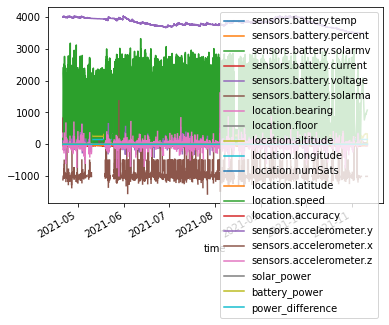

In [20]:
groupByDeviceIdAndTimeIndex.loc['015262001281806'].plot()

In [21]:
# groupByDeviceIdAndTimeIndex.columns
columns = ['sensors.battery.temp',
       'sensors.battery.percent', 'sensors.battery.solarmv',
       'sensors.battery.current', 'sensors.battery.voltage',
       'sensors.battery.solarma', 'sensors.battery.charging',
        'solar_power', 'battery_power','power_difference']

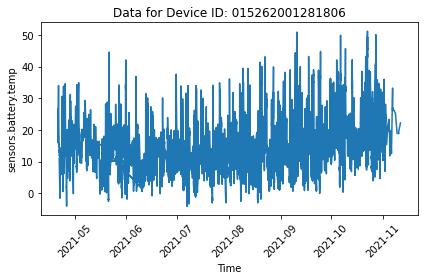

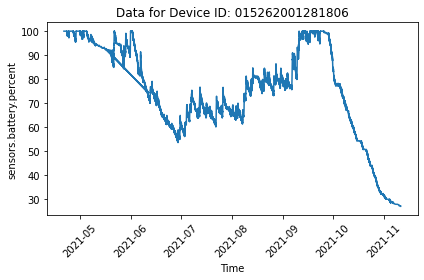

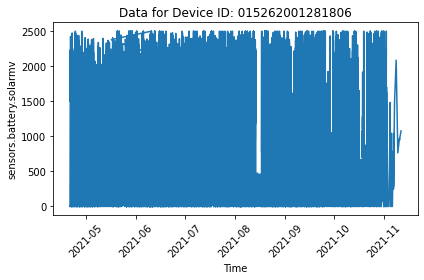

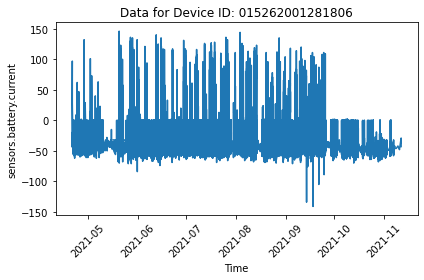

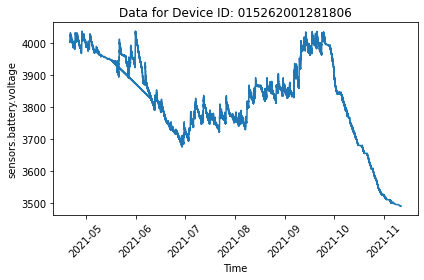

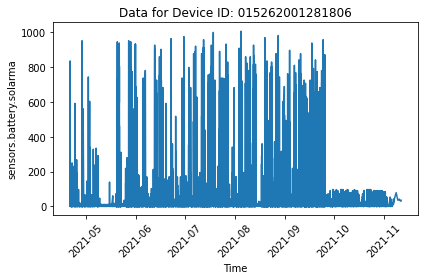

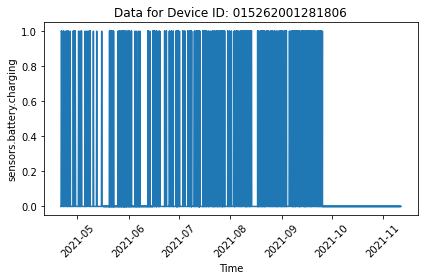

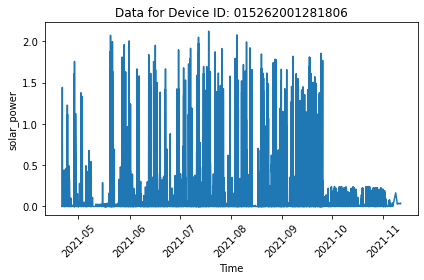

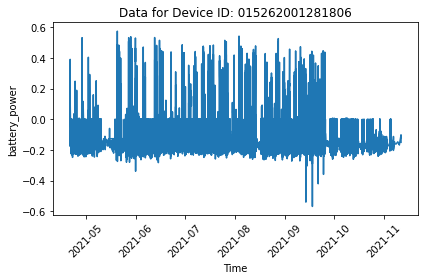

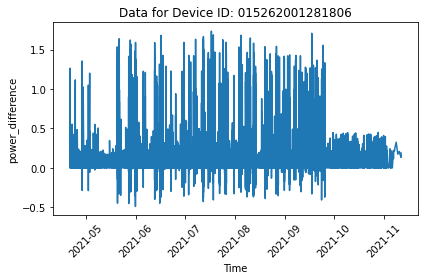

In [22]:
import matplotlib
for column in columns:
    plt.plot(groupByDeviceIdAndTimeIndex.loc['015262001281806'].index.get_level_values('time'),groupByDeviceIdAndTimeIndex.loc['015262001281806'][column], label = column)
    plt.xlabel('Time')
    plt.ylabel(column)
    plt.title('Data for Device ID: 015262001281806')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

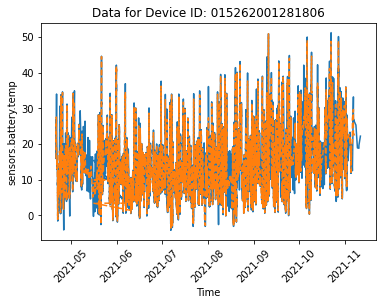

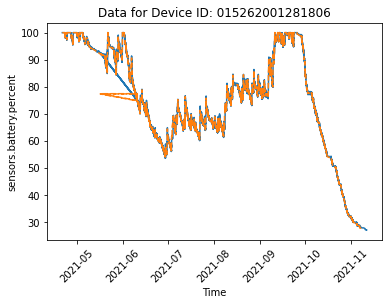

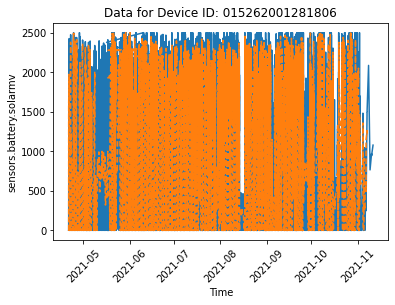

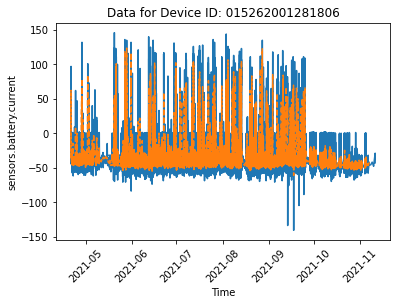

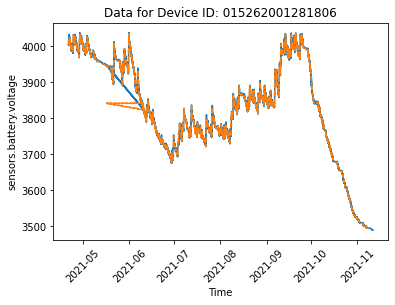

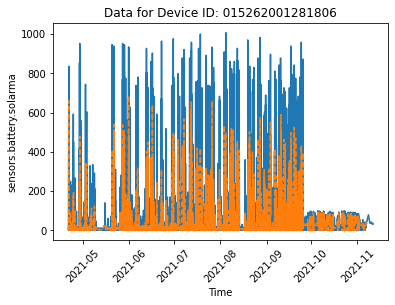

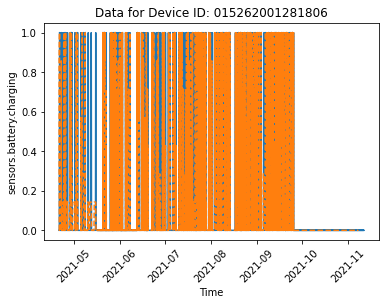

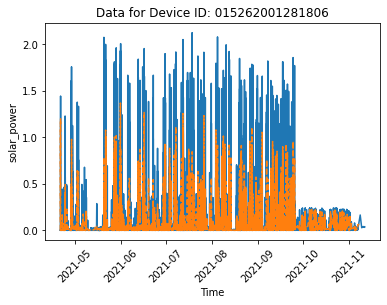

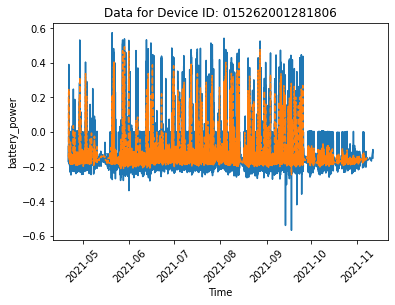

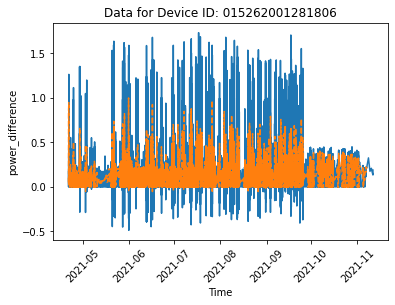

In [23]:
# Calculate a simple moving average
window_size = 7

for column in columns:
    x = groupByDeviceIdAndTimeIndex.loc['015262001281806'].index.get_level_values('time')
    y = groupByDeviceIdAndTimeIndex.loc['015262001281806'][column]
    moving_avg = np.convolve(y, np.ones(window_size)/window_size, mode='valid')
    plt.plot(x,y, label = column)
    plt.plot(x[:len(moving_avg)], moving_avg, label=f"{window_size}-point Moving Average", linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(column)
    plt.title('Data for Device ID: 015262001281806')
    plt.xticks(rotation=45)
#     plt.tight_layout()
    plt.show()

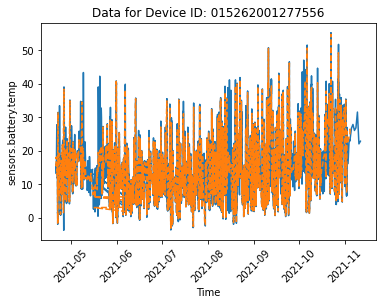

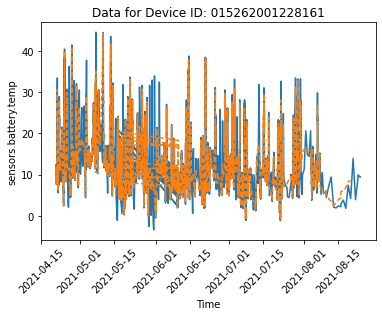

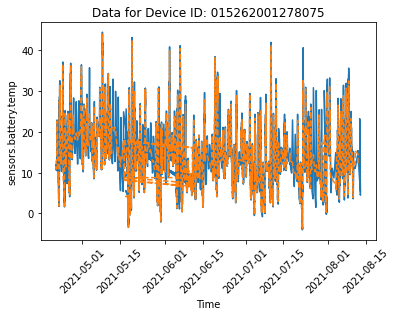

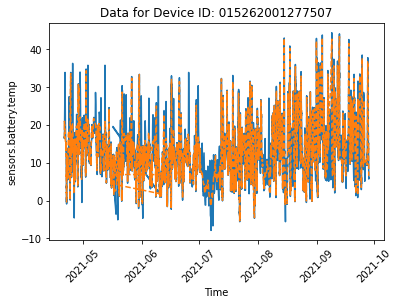

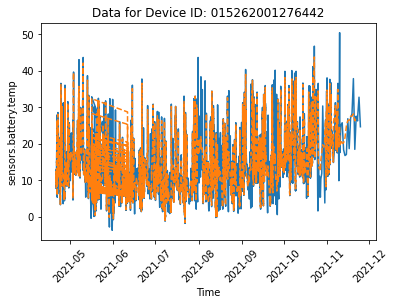

...

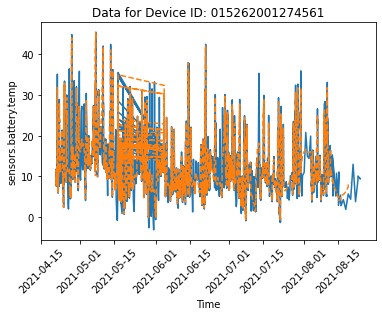

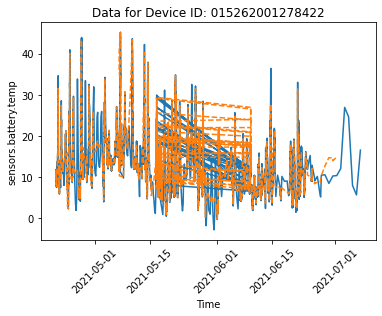

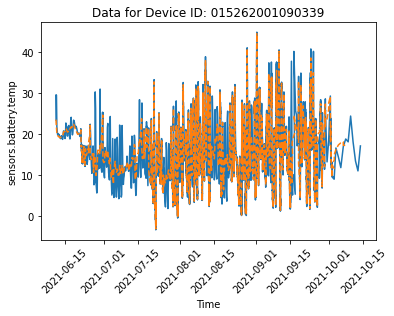

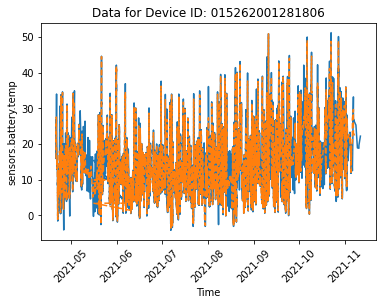

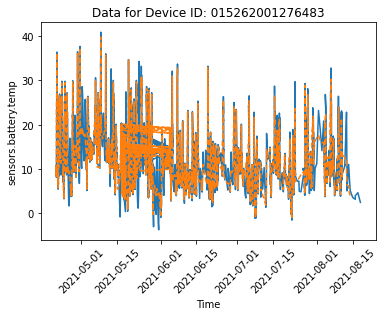

In [24]:
# For all device IDs
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    for column in ['sensors.battery.temp']:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column]
        moving_avg = np.convolve(y, np.ones(window_size)/window_size, mode='valid')
        plt.plot(x,y, label = column)
        plt.plot(x[:len(moving_avg)], moving_avg, label=f"{window_size}-point Moving Average", linestyle='--')
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.title('Data for Device ID: '+deviceId)
        plt.xticks(rotation=45)
    #     plt.tight_layout()
        plt.show()

#     print(deviceId)

In [25]:
# Label devices as malfunctioned or working
# We start by defaulting every row of each device to True
groupByDeviceIdAndTimeIndex["isDeviceWorking"] = True
groupByDeviceIdAndTimeIndex["predictive_parameter"] = None

In [26]:
import ruptures as rpt

In [27]:
# Change Point Detection with Pelt (Pruned Exact Linear Time) 

# print("Change Point Detection with Pelt (Pruned Exact Linear Time)")
# for column in columns:
#     x = groupByDeviceIdAndTimeIndex.loc['015262001281806'].index.get_level_values('time')
#     y = groupByDeviceIdAndTimeIndex.loc['015262001281806'][column].values.reshape(-1, 1)
# #     print("Data for device parameter: "+column)
# #     print("Earliest timestamp recorded: ",x[0])
# #     print("Latest timestamp recorded: ",x[-1])
# #     Minimum length of a segment should be 1000 data points - A hypermeter
#     algo = rpt.Pelt(model="l2", min_size=4000)
#     algo.fit(y)
#     result = algo.predict(pen=1)
#     rpt.display(y, [], result)

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3


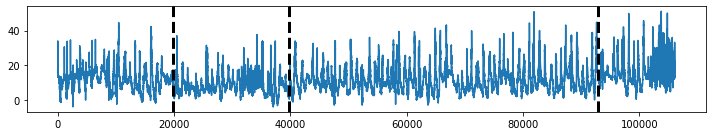

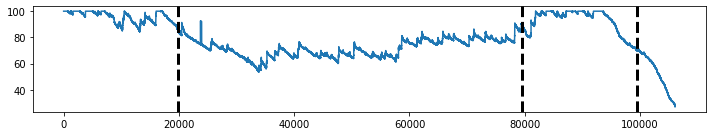

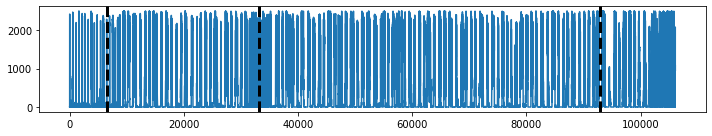

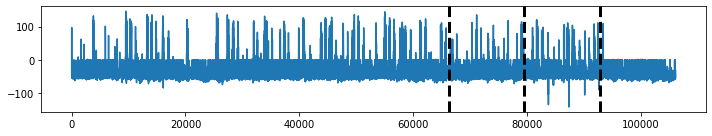

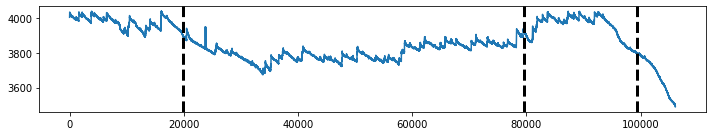

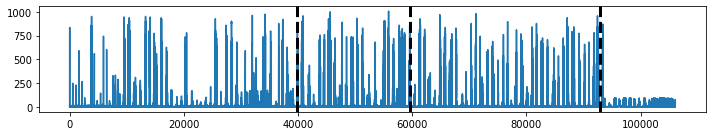

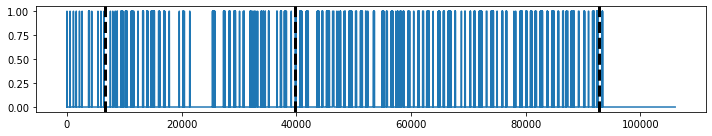

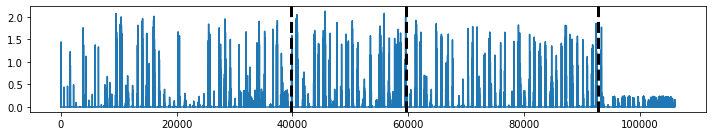

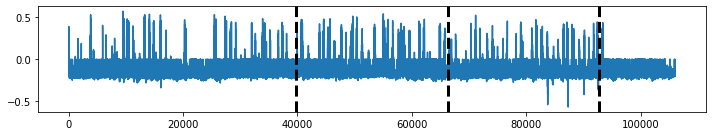

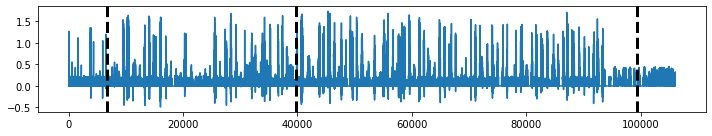

In [28]:
# Detecting Change Points With The Bottom-Up Method
# n_bkps is a hyperparameter that requires tuning - number of change points

breakpoints=3
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
for column in columns:
    x = groupByDeviceIdAndTimeIndex.loc['015262001281806'].index.get_level_values('time')
    y = groupByDeviceIdAndTimeIndex.loc['015262001281806'][column].values.reshape(-1, 1)
    algo = rpt.BottomUp(model="l2", min_size=4000)
    algo.fit(y)
    result = algo.predict(n_bkps=breakpoints)
#     print(result)
    rpt.display(y, [], result)

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.temp


C:\Python310\lib\site-packages\ruptures\show\display.py:73: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axarr = plt.subplots(n_features, sharex=True, **matplotlib_options)


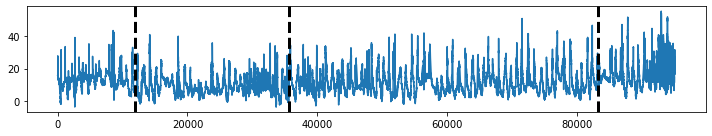

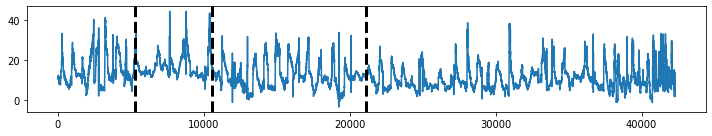

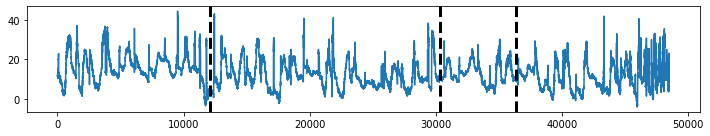

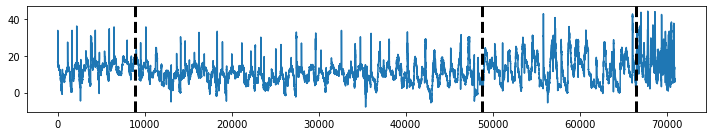

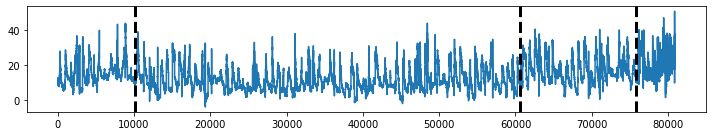

...

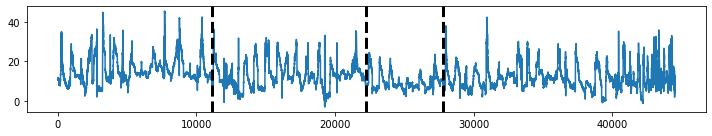

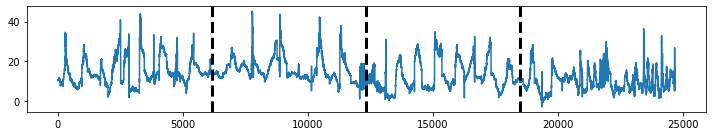

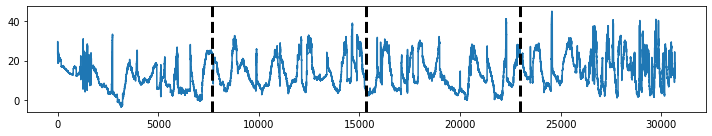

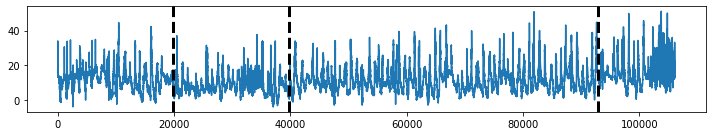

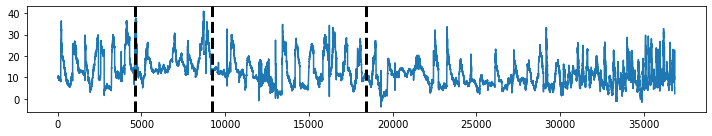

In [29]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.temp'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.percent


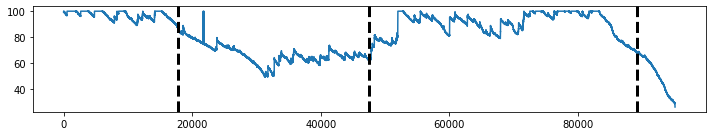

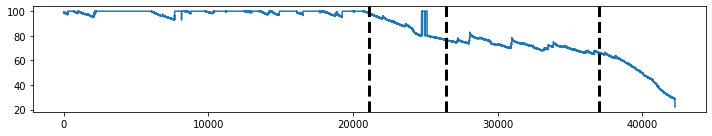

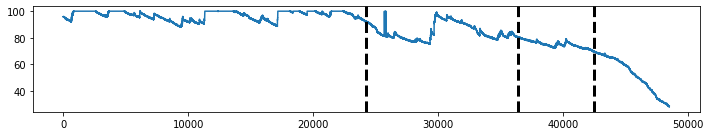

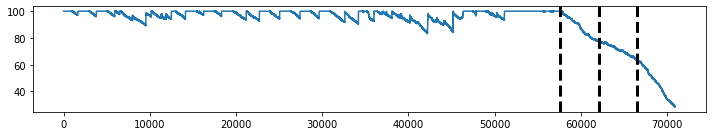

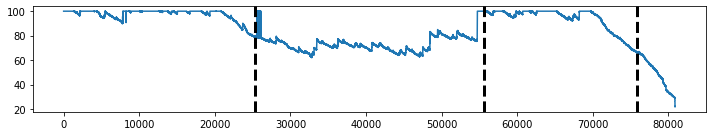

...

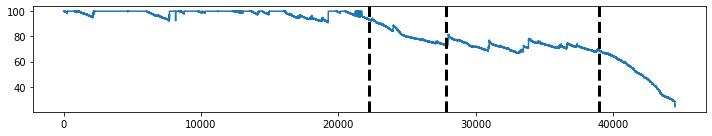

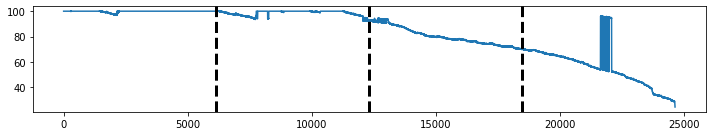

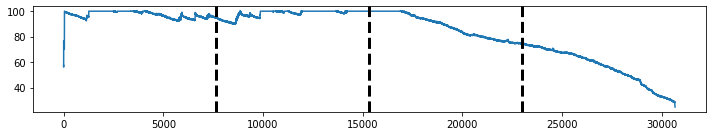

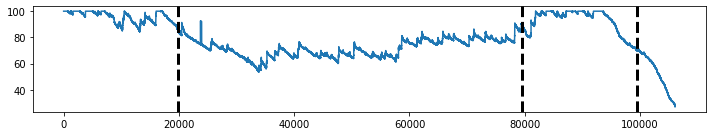

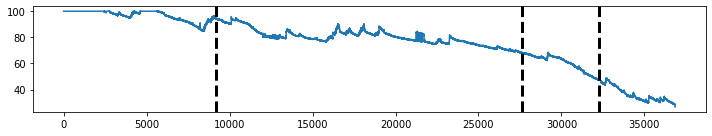

In [30]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.percent'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.solarmv


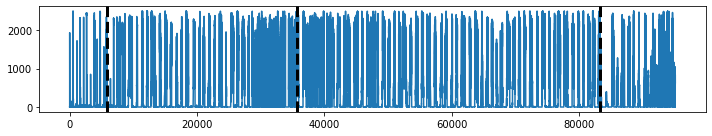

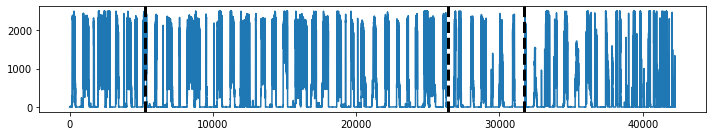

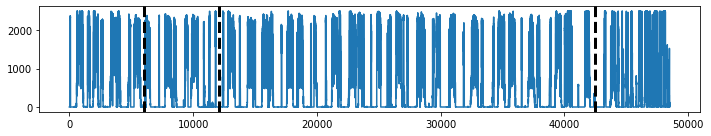

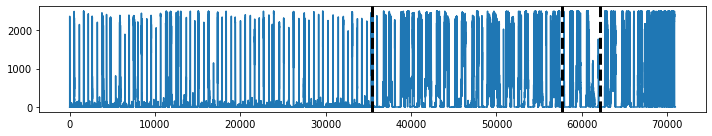

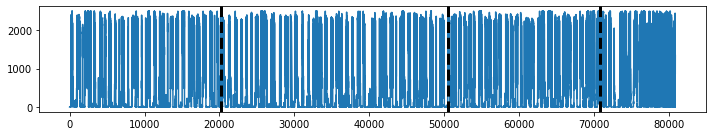

...

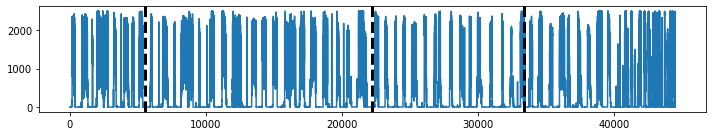

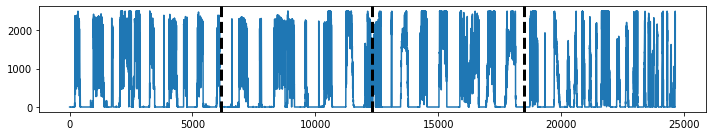

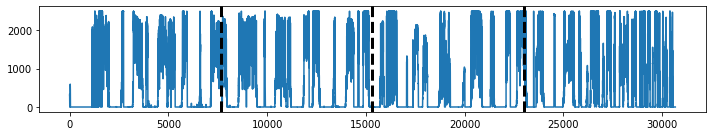

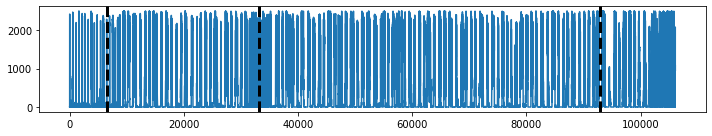

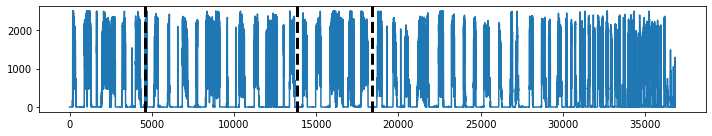

In [31]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.solarmv'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.current


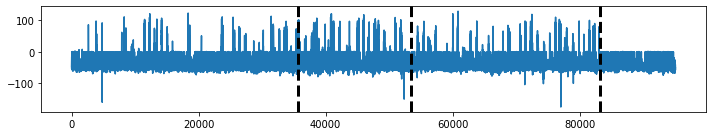

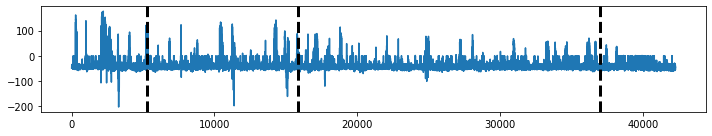

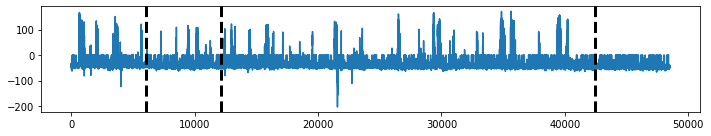

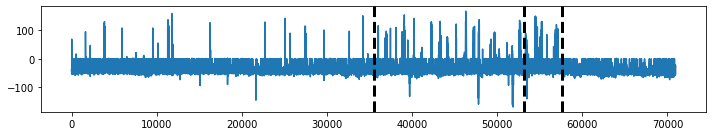

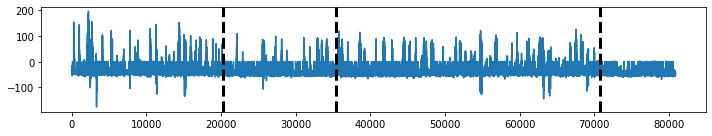

...

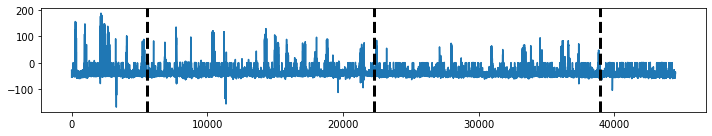

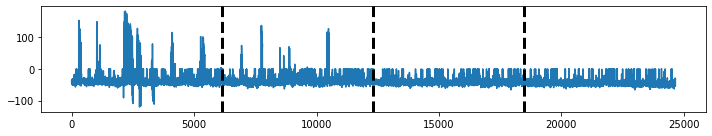

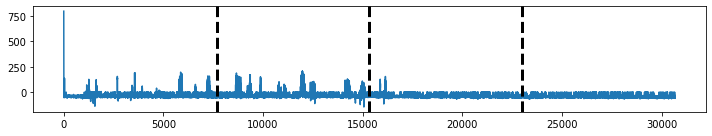

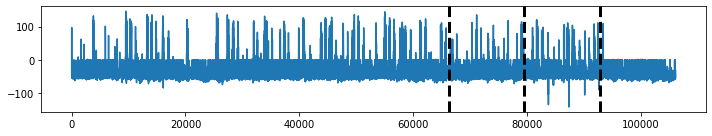

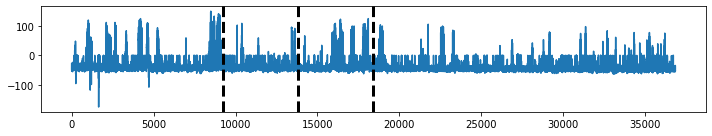

In [32]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.current'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.charging


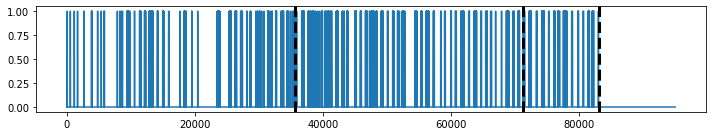

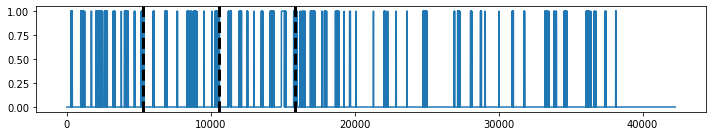

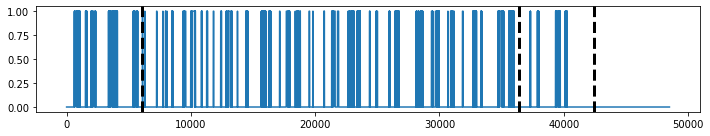

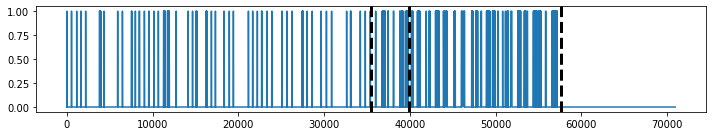

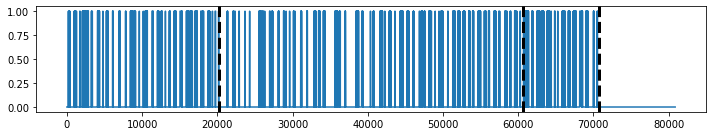

...

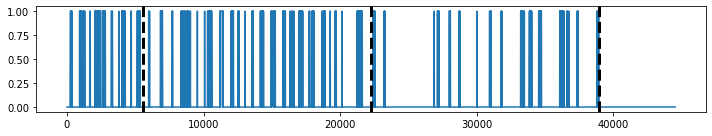

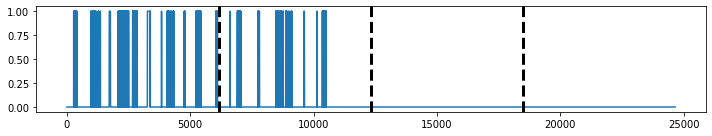

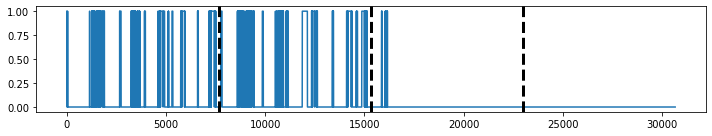

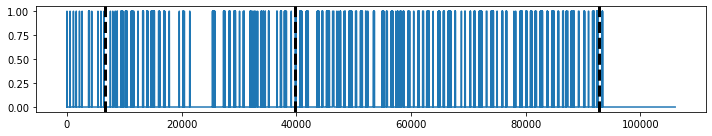

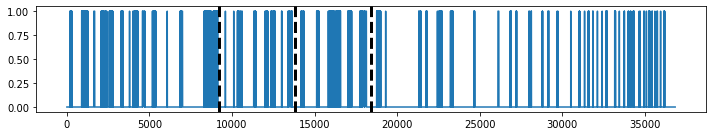

In [33]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.charging'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.solarma


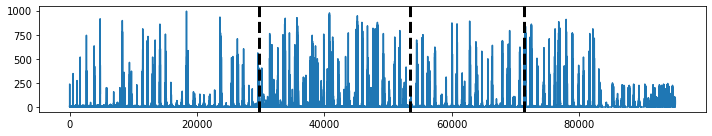

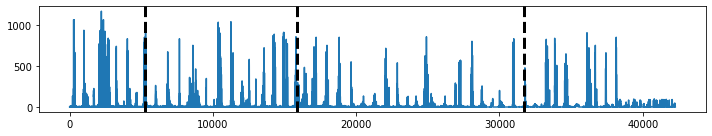

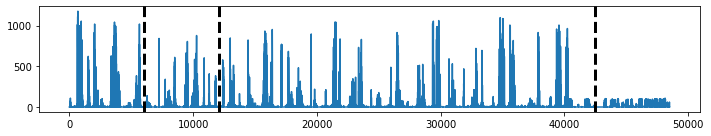

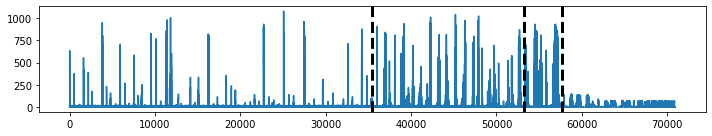

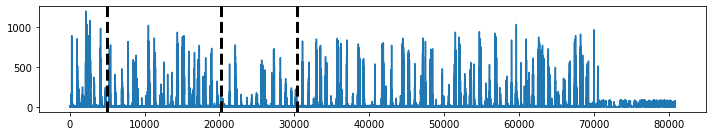

...

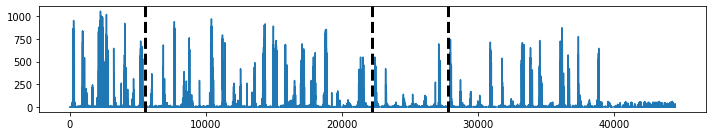

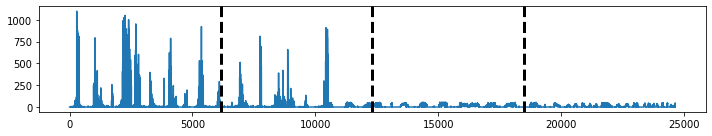

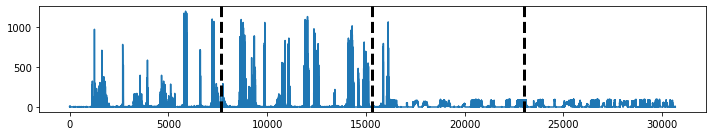

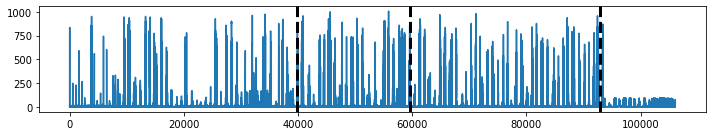

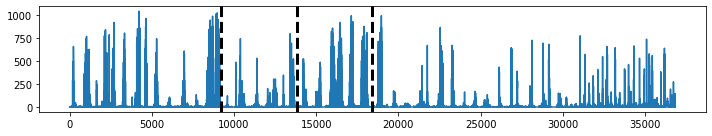

In [34]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.solarma'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  sensors.battery.voltage


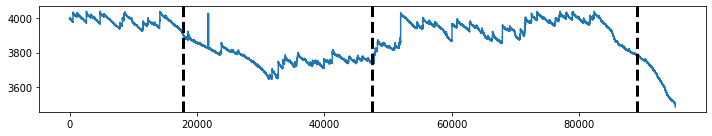

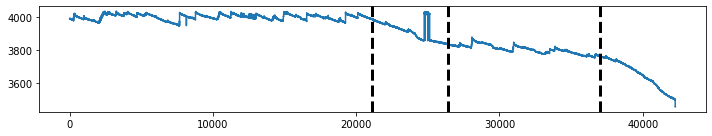

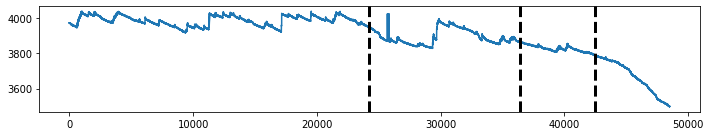

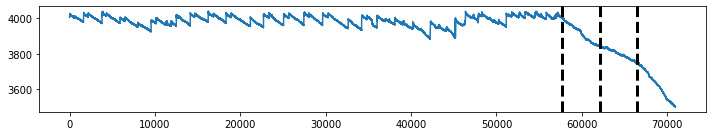

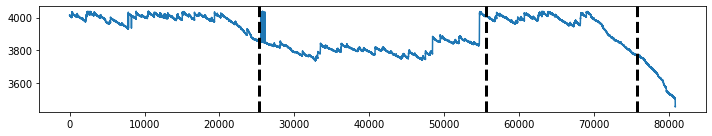

...

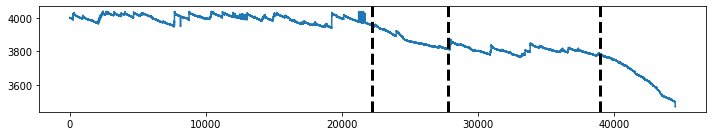

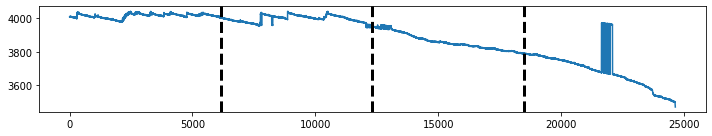

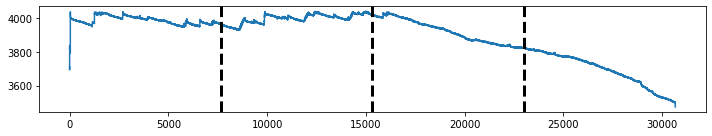

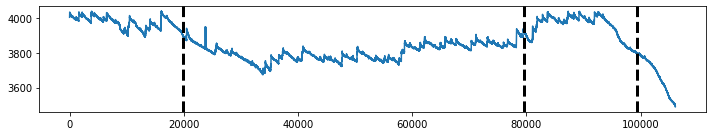

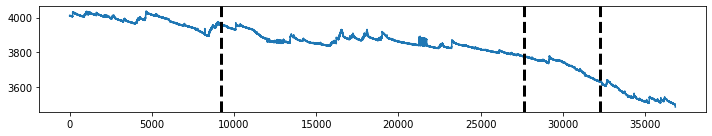

In [35]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'sensors.battery.voltage'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  solar_power


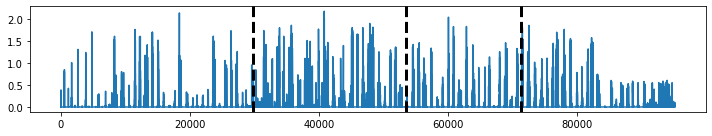

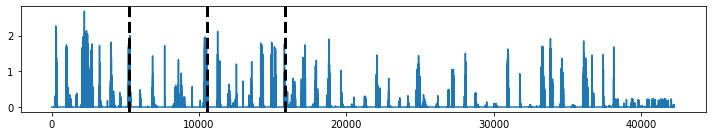

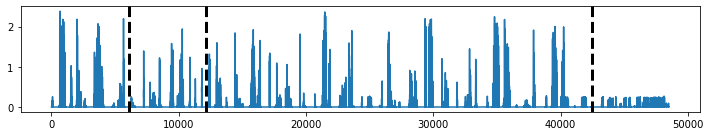

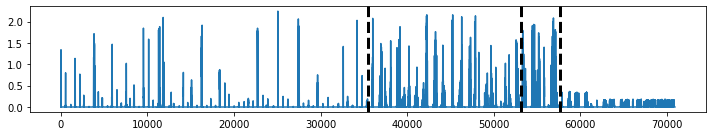

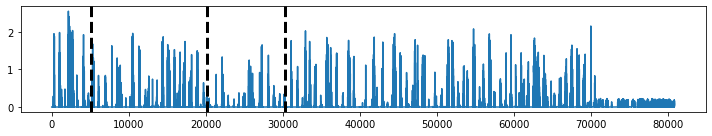

...

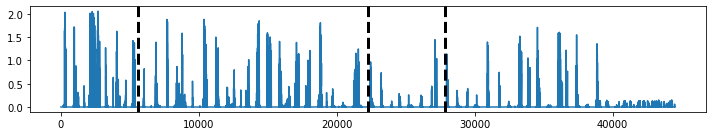

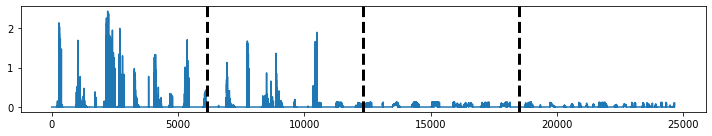

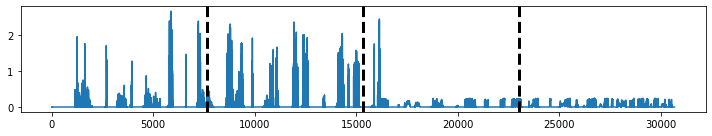

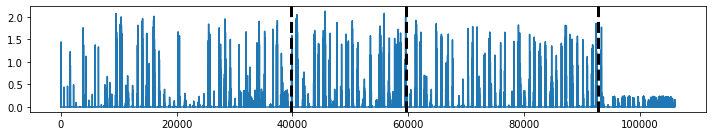

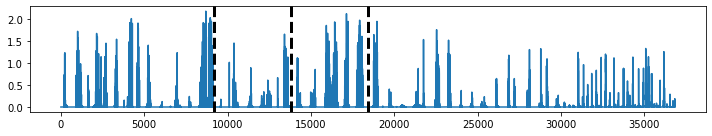

In [36]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'solar_power'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  battery_power


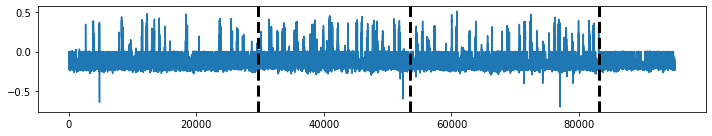

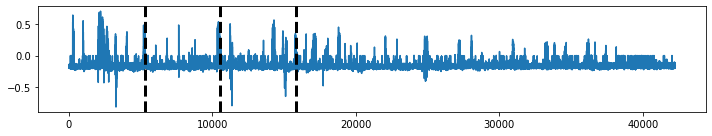

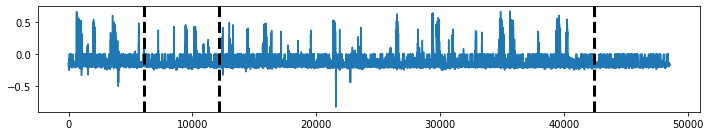

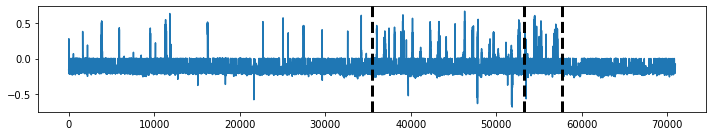

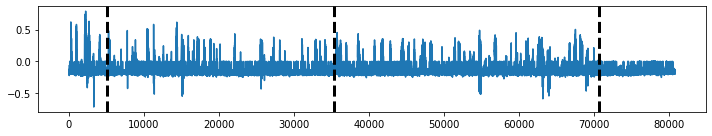

...

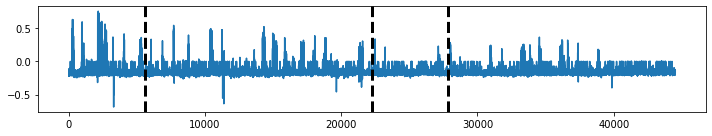

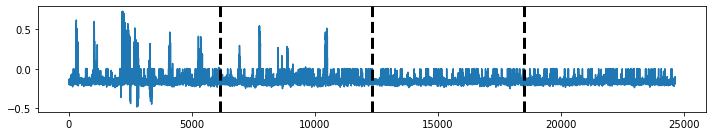

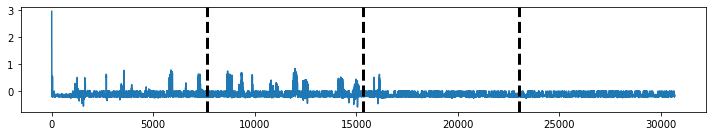

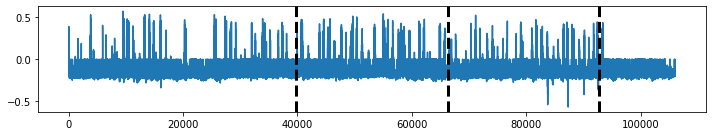

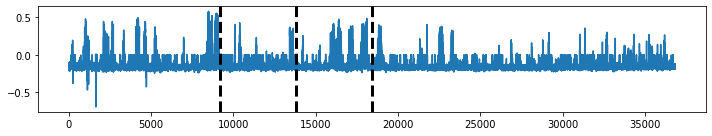

In [37]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'battery_power'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

Change Point Detection With The Bottom-Up Method and number of breakpoints =  3
Device Parameter being Analysed:  power_difference


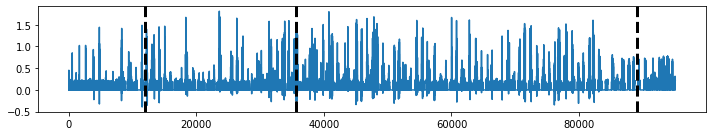

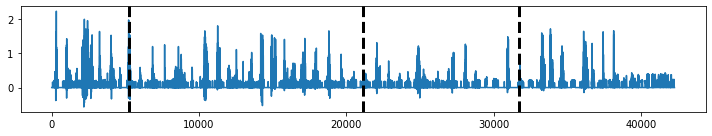

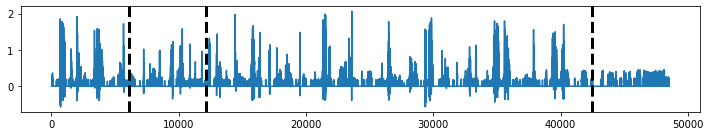

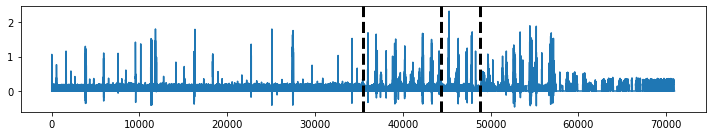

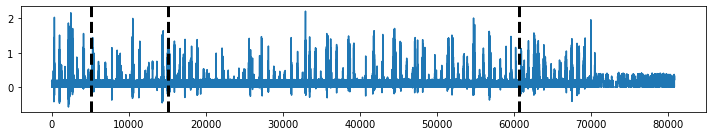

...

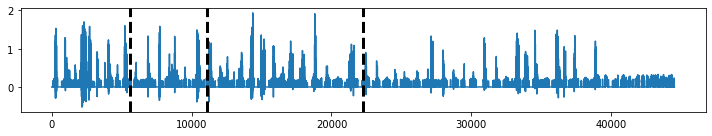

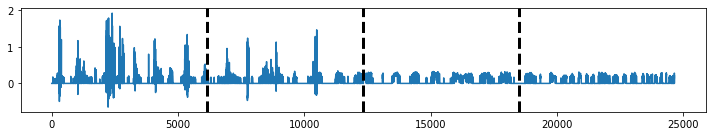

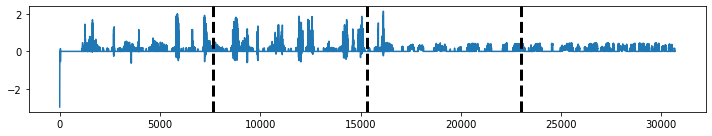

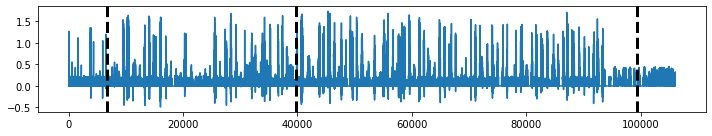

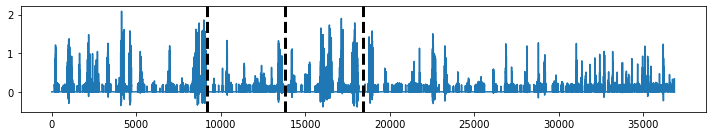

In [38]:
# Analyse Change point Detection for all devices, grouped by Column
breakpoints=3
column = 'power_difference'
print("Change Point Detection With The Bottom-Up Method and number of breakpoints = ",breakpoints)
print("Device Parameter being Analysed: ", column)
for deviceId in set(groupByDeviceIdAndTimeIndex.index.get_level_values('DeviceId')):
    try:
        x = groupByDeviceIdAndTimeIndex.loc[deviceId].index.get_level_values('time')
        y = groupByDeviceIdAndTimeIndex.loc[deviceId][column].values.reshape(-1, 1)
        algo = rpt.BottomUp(model="l2", min_size=4000)
        algo.fit(y)
        result = algo.predict(n_bkps=breakpoints)
    #     print(result)
        rpt.display(y, [], result)
    except:
        continue

In [39]:
# The last change point will be a definite time when the device has malfunction
# Analysing multiple devices gives clarity as to 
# which device parameter shows best results in change point detection of malfunction.